# FloodNet CNN — Enhanced Kaggle Notebook
**Binary flood classification using custom CNN + EfficientNetB0 transfer learning.**

Features:
- Robust image loading with error handling
- BatchNormalization & deeper custom CNN
- EfficientNetB0 with staged fine-tuning (freeze → unfreeze top layers)
- Test-Time Augmentation (TTA) for improved predictions
- Full metrics: Accuracy, Precision, Recall, F1, ROC-AUC, MCC
- Training history plots, confusion matrices, ROC curves
- Grad-CAM visualisation on both models
- All outputs saved to CSV & PDF


In [1]:
import os, cv2, numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from tqdm import tqdm
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, roc_curve,
    matthews_corrcoef, average_precision_score
)
from sklearn.utils.class_weight import compute_class_weight

import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Conv2D, SeparableConv2D, MaxPooling2D, GlobalAveragePooling2D,
    Dense, Dropout, BatchNormalization, Flatten, Add, Activation
)
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, CSVLogger
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

import warnings
warnings.filterwarnings('ignore')

# Reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow:", tf.__version__)
print("GPUs:", tf.config.list_physical_devices('GPU'))


2026-06-26 10:48:55.442440: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1782470935.635736      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1782470935.690221      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1782470936.140981      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782470936.141030      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782470936.141032      58 computation_placer.cc:177] computation placer alr

TensorFlow: 2.19.0
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# ── Global config ────────────────────────────────────────────────────────────
IMG_SIZE      = 224
BATCH_SIZE    = 16
CNN_EPOCHS    = 30
EFF_EPOCHS_1  = 15   # frozen-base phase
EFF_EPOCHS_2  = 10   # fine-tuning phase
FINE_TUNE_AT  = 100  # unfreeze from this layer index onward
TTA_STEPS     = 8    # test-time augmentation passes
DROPOUT_RATE  = 0.4
L2_REG        = 1e-4

DATASET_PATH     = '/kaggle/input/datasets/aletbm/aerial-imagery-dataset-floodnet-challenge'
FLOODED_PATH     = os.path.join(DATASET_PATH,
                       'FloodNet Challenge - Track 1','Train','Labeled','Flooded','image')
NON_FLOODED_PATH = os.path.join(DATASET_PATH,
                       'FloodNet Challenge - Track 1','Train','Labeled','Non-Flooded','image')

for p in ['outputs/figures', 'outputs/tables', 'outputs/models', 'outputs/logs']:
    os.makedirs(p, exist_ok=True)

print("Flooded images   :", len(os.listdir(FLOODED_PATH)))
print("Non-Flooded images:", len(os.listdir(NON_FLOODED_PATH)))


Flooded images   : 51
Non-Flooded images: 347


## 1 · Data Loading & EDA

In [3]:
def load_class(folder: str, label: int, img_size: int = IMG_SIZE):
    """Load, resize, and normalise images from *folder*; skip corrupt files."""
    files = [f for f in os.listdir(folder)
             if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    imgs, lbls, paths = [], [], []
    for f in tqdm(files, desc=f'Label {label}'):
        path = os.path.join(folder, f)
        img = cv2.imread(path)
        if img is None:
            print(f'  [WARN] Cannot read {f} — skipped')
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (img_size, img_size))
        imgs.append(img.astype(np.float32) / 255.0)
        lbls.append(label)
        paths.append(path)
    return imgs, lbls, paths

flooded_imgs,    flooded_lbls,    flooded_paths    = load_class(FLOODED_PATH,     1)
non_flooded_imgs, non_flooded_lbls, non_flooded_paths = load_class(NON_FLOODED_PATH, 0)

X = np.array(flooded_imgs + non_flooded_imgs, dtype=np.float32)
y = np.array(flooded_lbls + non_flooded_lbls,  dtype=np.int32)
all_paths = flooded_paths + non_flooded_paths

if len(X) == 0:
    raise ValueError('No images loaded. Check dataset paths.')

print(f'\nTotal samples : {len(X)}')
print(f'Flooded        : {y.sum()}')
print(f'Non-flooded    : {(y == 0).sum()}')
print(f'Imbalance ratio: {y.mean():.3f}')


Label 0: 100%|██████████| 347/347 [00:55<00:00,  6.21it/s]



Total samples : 398
Flooded        : 51
Non-flooded    : 347
Imbalance ratio: 0.128


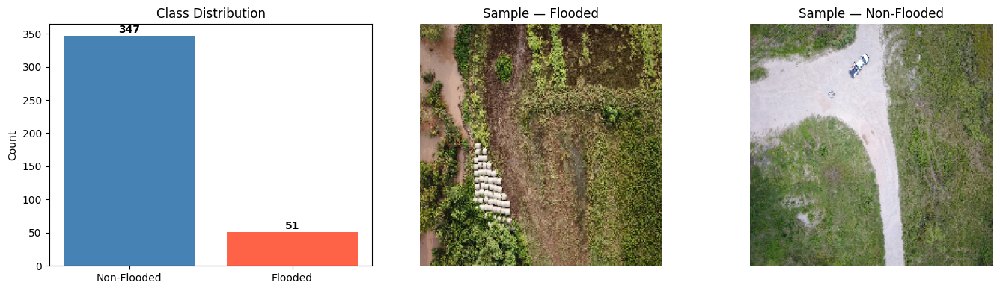

Red: mean=0.4104  std=0.2058
Green: mean=0.4487  std=0.1917
Blue: mean=0.3378  std=0.2067


In [4]:
# Class distribution
dist = pd.DataFrame({'Class': ['Non-Flooded','Flooded'], 'Count': [(y==0).sum(), y.sum()]})
dist.to_csv('outputs/tables/class_distribution.csv', index=False)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

axes[0].bar(dist['Class'], dist['Count'], color=['steelblue','tomato'])
axes[0].set_title('Class Distribution')
axes[0].set_ylabel('Count')
for bar, cnt in zip(axes[0].patches, dist['Count']):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                 str(cnt), ha='center', va='bottom', fontweight='bold')

# Sample flooded
axes[1].imshow(flooded_imgs[0])
axes[1].set_title('Sample — Flooded')
axes[1].axis('off')

# Sample non-flooded
axes[2].imshow(non_flooded_imgs[0])
axes[2].set_title('Sample — Non-Flooded')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('outputs/figures/eda_overview.pdf', bbox_inches='tight')
plt.show(); plt.close()

# Per-channel pixel statistics
for ch, name in enumerate(['Red','Green','Blue']):
    print(f'{name}: mean={X[:,:,:,ch].mean():.4f}  std={X[:,:,:,ch].std():.4f}')


## 2 · Train / Validation / Test Split & Class Weights

In [5]:
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.30, stratify=y, random_state=SEED)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=SEED)

print(f'Train : {len(X_train)} | Val : {len(X_val)} | Test : {len(X_test)}')

# Balanced class weights (handles imbalance)
raw_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = {i: w for i, w in enumerate(raw_weights)}
print('Class weights:', class_weights)

# Augmentation pipelines
train_gen = ImageDataGenerator(
    rotation_range=25,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='reflect'
)

tta_gen = ImageDataGenerator(          # augments only at inference time
    rotation_range=15,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.1
)


Train : 278 | Val : 60 | Test : 60
Class weights: {0: np.float64(0.5743801652892562), 1: np.float64(3.861111111111111)}


## 3 · Custom CNN with Residual-style Blocks

In [6]:
def conv_bn_relu(x, filters, kernel=3, strides=1):
    """Conv → BatchNorm → ReLU block."""    
    x = Conv2D(filters, kernel, strides=strides, padding='same',
               kernel_regularizer=l2(L2_REG), use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def residual_block(x, filters):
    """Lightweight residual block (no projection shortcut when filters match)."""    
    shortcut = x
    x = conv_bn_relu(x, filters)
    x = Conv2D(filters, 3, padding='same',
               kernel_regularizer=l2(L2_REG), use_bias=False)(x)
    x = BatchNormalization()(x)
    if shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, 1, padding='same',
                          kernel_regularizer=l2(L2_REG), use_bias=False)(shortcut)
        shortcut = BatchNormalization()(shortcut)
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def build_custom_cnn(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = Input(shape=input_shape, name='input')

    # Stage 1
    x = conv_bn_relu(inputs, 32, kernel=7, strides=2)     # 112×112
    x = MaxPooling2D()(x)                                  # 56×56

    # Stage 2
    x = residual_block(x, 64)
    x = MaxPooling2D()(x)                                  # 28×28

    # Stage 3
    x = residual_block(x, 128)
    x = MaxPooling2D()(x)                                  # 14×14

    # Stage 4 — named for Grad-CAM
    x = SeparableConv2D(256, 3, padding='same',
                        depthwise_regularizer=l2(L2_REG),
                        use_bias=False, name='last_conv')(x)
    x = BatchNormalization(name='last_bn')(x)
    x = Activation('relu', name='last_relu')(x)
    x = MaxPooling2D()(x)                                  # 7×7

    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(L2_REG))(x)
    x = Dropout(DROPOUT_RATE)(x)
    x = Dense(64, activation='relu', kernel_regularizer=l2(L2_REG))(x)
    x = Dropout(DROPOUT_RATE / 2)(x)
    outputs = Dense(1, activation='sigmoid', name='output')(x)

    model = Model(inputs, outputs, name='CustomCNN')
    model.compile(
        optimizer=Adam(learning_rate=1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

cnn = build_custom_cnn()
cnn.summary()
print(f'Trainable params: {cnn.count_params():,}')


I0000 00:00:1782471015.587489      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 224, 224,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │      4,704 │ input[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 56, 56,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 56, 56,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 56, 56,    │     36,864 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 56, 56,    │      2,048 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 56, 56,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 56, 56,    │          0 │ add[0][0]         │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 28, 28,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 28, 28,    │     73,728 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │        512 │ conv2d_4[0][0]  

 Total params: 411,105 (1.57 MB)

 Trainable params: 409,377 (1.56 MB)

 Non-trainable params: 1,728 (6.75 KB)

Trainable params: 411,105


In [7]:
cnn_callbacks = [
    EarlyStopping(monitor='val_auc', mode='max', patience=7,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4,
                      min_lr=1e-6, verbose=1),
    ModelCheckpoint('outputs/models/cnn_best.h5',
                    monitor='val_auc', mode='max',
                    save_best_only=True, verbose=0),
    CSVLogger('outputs/logs/cnn_training.csv')
]

cnn_history = cnn.fit(
    train_gen.flow(X_train, y_train, batch_size=BATCH_SIZE, seed=SEED),
    steps_per_epoch=len(X_train) // BATCH_SIZE,
    validation_data=(X_val, y_val),
    epochs=CNN_EPOCHS,
    class_weight=class_weights,
    callbacks=cnn_callbacks
)


Epoch 1/30


I0000 00:00:1782471022.745161     133 service.cc:152] XLA service 0x7b48f800a0f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1782471022.745210     133 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1782471023.721127     133 cuda_dnn.cc:529] Loaded cuDNN version 91002


 1/17 ━━━━━━━━━━━━━━━━━━━━ 3:30 13s/step - accuracy: 0.6875 - auc: 0.0513 - loss: 1.2930

I0000 00:00:1782471030.579026     133 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - accuracy: 0.6881 - auc: 0.4214 - loss: 0.8786

17/17 ━━━━━━━━━━━━━━━━━━━━ 27s 858ms/step - accuracy: 0.6832 - auc: 0.5173 - loss: 0.8204 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.7806 - learning_rate: 0.0010
Epoch 2/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8125 - auc: 0.0000e+00 - loss: 0.6537 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.7798 - learning_rate: 0.0010
Epoch 3/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - accuracy: 0.7440 - auc: 0.3925 - loss: 0.8503

17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step - accuracy: 0.7595 - auc: 0.4303 - loss: 0.8889 - val_accuracy: 0.1333 - val_auc: 0.5144 - val_loss: 0.7729 - learning_rate: 0.0010
Epoch 4/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7500 - auc: 0.5000 - loss: 1.0193 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.7776 - learning_rate: 0.0010
Epoch 5/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.5534 - auc: 0.5370 - loss: 0.8158 - val_accuracy: 0.8667 - val_auc: 0.3317 - val_loss: 0.7473 - learning_rate: 0.0010
Epoch 6/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5000 - auc: 0.6429 - loss: 0.7462 - val_accuracy: 0.8667 - val_auc: 0.3654 - val_loss: 0.7423 - learning_rate: 0.0010
Epoch 7/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.5802 - auc: 0.4800 - loss: 0.8358 - val_accuracy: 0.8667 - val_auc: 0.3582 - val_loss: 0.7214 - learning_rate: 0.0010
Epoch 8/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6250 - auc: 0.3750 - loss: 0.79

## 4 · EfficientNetB0 Transfer Learning + Fine-Tuning

In [8]:
def build_efficientnet(trainable_base=False, fine_tune_at=FINE_TUNE_AT):
    base = EfficientNetB0(weights='imagenet', include_top=False,
                          input_shape=(IMG_SIZE, IMG_SIZE, 3))
    base.trainable = trainable_base
    if trainable_base:
        for layer in base.layers[:fine_tune_at]:
            layer.trainable = False

    inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = base(inputs, training=trainable_base)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(L2_REG))(x)
    x = Dropout(DROPOUT_RATE)(x)
    x = Dense(64, activation='relu', kernel_regularizer=l2(L2_REG))(x)
    x = Dropout(DROPOUT_RATE / 2)(x)
    out = Dense(1, activation='sigmoid')(x)

    lr = 1e-4 if trainable_base else 1e-3
    model = Model(inputs, out, name='EfficientNetB0')
    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='binary_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])
    return model

# Phase 1 — frozen base
eff = build_efficientnet(trainable_base=False)
eff.summary()

eff_callbacks_1 = [
    EarlyStopping(monitor='val_auc', mode='max', patience=5,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3,
                      min_lr=1e-6, verbose=1),
    CSVLogger('outputs/logs/eff_phase1.csv')
]

eff_hist1 = eff.fit(
    train_gen.flow(X_train, y_train, batch_size=BATCH_SIZE, seed=SEED),
    steps_per_epoch=len(X_train) // BATCH_SIZE,
    validation_data=(X_val, y_val),
    epochs=EFF_EPOCHS_1,
    class_weight=class_weights,
    callbacks=eff_callbacks_1
)

# Phase 2 — fine-tune top layers
print(f'\nFine-tuning from layer {FINE_TUNE_AT}...')
eff_ft = build_efficientnet(trainable_base=True, fine_tune_at=FINE_TUNE_AT)
eff_ft.set_weights(eff.get_weights())   # carry over trained head weights

eff_callbacks_2 = [
    EarlyStopping(monitor='val_auc', mode='max', patience=5,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3,
                      min_lr=1e-7, verbose=1),
    ModelCheckpoint('outputs/models/eff_best.h5',
                    monitor='val_auc', mode='max',
                    save_best_only=True, verbose=0),
    CSVLogger('outputs/logs/eff_phase2.csv')
]

eff_hist2 = eff_ft.fit(
    train_gen.flow(X_train, y_train, batch_size=BATCH_SIZE, seed=SEED),
    steps_per_epoch=len(X_train) // BATCH_SIZE,
    validation_data=(X_val, y_val),
    epochs=EFF_EPOCHS_2,
    class_weight=class_weights,
    callbacks=eff_callbacks_2
)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,394,020 (16.76 MB)

 Trainable params: 344,449 (1.31 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

Epoch 1/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.7634 - auc: 0.5145 - loss: 0.8224 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.9751 - learning_rate: 0.0010
Epoch 2/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.3750 - auc: 0.4545 - loss: 1.0436 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 1.0391 - learning_rate: 0.0010
Epoch 3/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 172ms/step - accuracy: 0.3282 - auc: 0.4378 - loss: 0.8236 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.7827 - learning_rate: 0.0010
Epoch 4/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4375 - auc: 0.0000e+00 - loss: 0.4475 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.7551 - learning_rate: 0.0010
Epoch 5/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 173ms/step - accuracy: 0.6412 - auc: 0.4340 - loss: 0.7781 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.9094 - learning_rate: 0.0010
Epoch 6/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4375 - auc: 0.7143

2026-06-26 10:52:33.053104: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:33.238465: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:33.675614: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:33.881227: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:34.232497: E external/local_xla/xla/stream_

10/17 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.8911 - auc: 0.2821 - loss: 0.7272

2026-06-26 10:52:58.254513: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:58.439547: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:58.836621: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-26 10:52:59.042038: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8836 - auc: 0.3780 - loss: 0.7322

17/17 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - accuracy: 0.8511 - auc: 0.5728 - loss: 0.7924 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.9262 - learning_rate: 1.0000e-04
Epoch 2/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6250 - auc: 0.4818 - loss: 1.9944 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.9247 - learning_rate: 1.0000e-04
Epoch 3/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 183ms/step - accuracy: 0.6176 - auc: 0.5761 - loss: 0.7436 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.8973 - learning_rate: 1.0000e-04
Epoch 4/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5000 - auc: 0.6000 - loss: 0.8125 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.8958 - learning_rate: 1.0000e-04
Epoch 5/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 173ms/step - accuracy: 0.5649 - auc: 0.5462 - loss: 0.7751 - val_accuracy: 0.1333 - val_auc: 0.5000 - val_loss: 0.8766 - learning_rate: 1.0000e-04
Epoch 6/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5625 - auc: 0

## 5 · Training History Plots

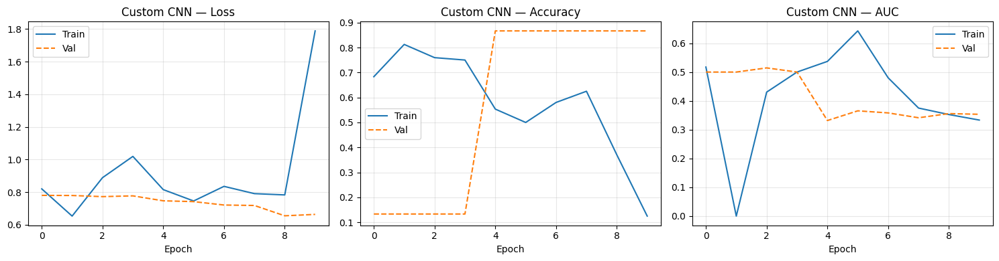

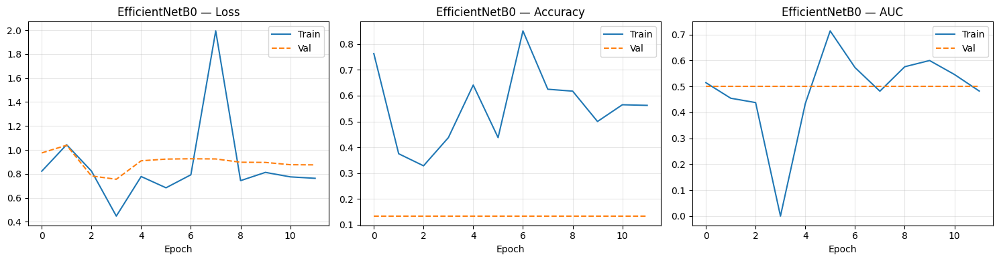

In [10]:
def plot_history(history, name, save_path):
    """Plot loss, accuracy, and AUC curves; save to PDF."""    
    metrics = ['loss', 'accuracy', 'auc']
    labels  = ['Loss', 'Accuracy', 'AUC']
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    for ax, m, lbl in zip(axes, metrics, labels):
        ax.plot(history.history.get(m, []),          label='Train')
        ax.plot(history.history.get(f'val_{m}', []), label='Val',  linestyle='--')
        ax.set_title(f'{name} — {lbl}')
        ax.set_xlabel('Epoch')
        ax.legend()
        ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(save_path, bbox_inches='tight')
    plt.show(); plt.close()

plot_history(cnn_history, 'Custom CNN',   'outputs/figures/cnn_training.pdf')

# Combine EfficientNet phases
import collections
combined_hist = collections.defaultdict(list)
for h in (eff_hist1, eff_hist2):
    for k, v in h.history.items():
        combined_hist[k].extend(v)

class _FakeHistory:
    def __init__(self, d): self.history = d
plot_history(_FakeHistory(combined_hist), 'EfficientNetB0', 'outputs/figures/eff_training.pdf')


## 6 · Test-Time Augmentation & Full Evaluation

Evaluating Custom CNN ...
[CustomCNN] Optimal threshold: 0.502
  Acc=0.4000  Prec=0.1628  Rec=1.0000  F1=0.2800  AUC=0.5054  AP=0.1273  MCC=0.2285


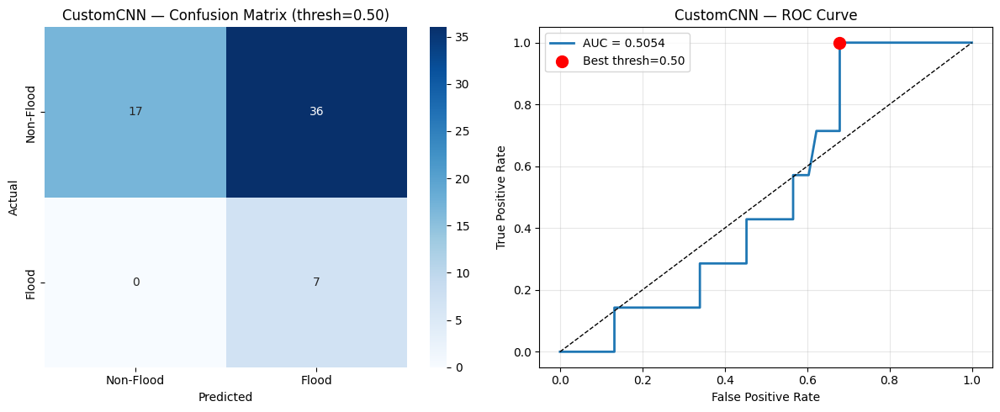


Evaluating EfficientNetB0 (fine-tuned) ...
[EfficientNetB0] Optimal threshold: 0.611
  Acc=0.3167  Prec=0.1458  Rec=1.0000  F1=0.2545  AUC=0.3396  AP=0.0962  MCC=0.1817


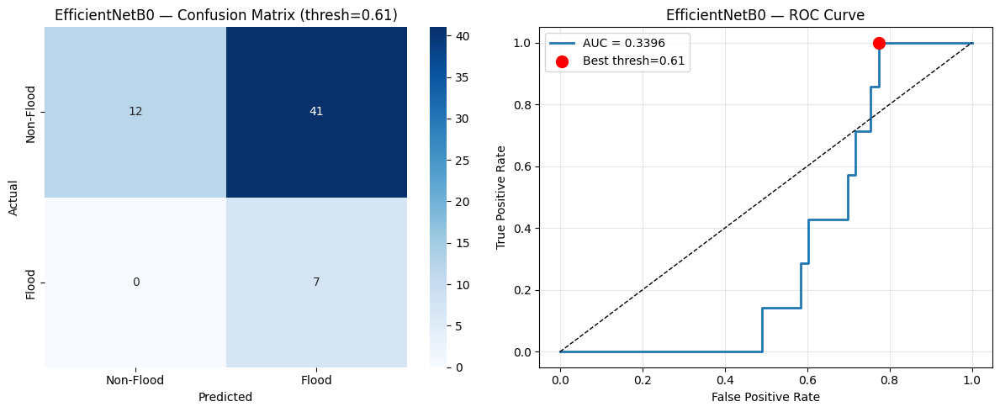

In [12]:
def predict_tta(model, X, n_steps=TTA_STEPS):
    """Average predictions over *n_steps* augmented copies of X."""    
    all_preds = np.zeros((n_steps, len(X)), dtype=np.float32)
    for i in range(n_steps):
        aug_X = np.stack([
            tta_gen.random_transform(img) for img in X
        ])
        all_preds[i] = model.predict(aug_X, verbose=0).flatten()
    return all_preds.mean(axis=0)

def evaluate_model(model, name, use_tta=True):
    """Compute all metrics; save confusion matrix, ROC, report CSV."""    
    if use_tta:
        probs = predict_tta(model, X_test)
    else:
        probs = model.predict(X_test, verbose=0).flatten()

    # Optimal threshold via Youden's J
    fpr, tpr, thresholds = roc_curve(y_test, probs)
    j_scores = tpr - fpr
    best_thresh = thresholds[np.argmax(j_scores)]
    print(f'[{name}] Optimal threshold: {best_thresh:.3f}')

    preds = (probs >= best_thresh).astype(int)

    # Metrics
    acc  = accuracy_score(y_test, preds)
    prec = precision_score(y_test, preds, zero_division=0)
    rec  = recall_score(y_test, preds, zero_division=0)
    f1   = f1_score(y_test, preds, zero_division=0)
    auc  = roc_auc_score(y_test, probs)
    ap   = average_precision_score(y_test, probs)
    mcc  = matthews_corrcoef(y_test, preds)

    print(f'  Acc={acc:.4f}  Prec={prec:.4f}  Rec={rec:.4f}  '
          f'F1={f1:.4f}  AUC={auc:.4f}  AP={ap:.4f}  MCC={mcc:.4f}')

    # Classification report
    report_df = pd.DataFrame(
        classification_report(y_test, preds, output_dict=True, zero_division=0)
    ).T
    report_df.to_csv(f'outputs/tables/{name}_report.csv')

    # Confusion matrix
    cm = confusion_matrix(y_test, preds)
    pd.DataFrame(cm,
                 index=['True Non-Flood','True Flood'],
                 columns=['Pred Non-Flood','Pred Flood']
    ).to_csv(f'outputs/tables/{name}_cm.csv')

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    # CM heatmap
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
                xticklabels=['Non-Flood','Flood'],
                yticklabels=['Non-Flood','Flood'])
    axes[0].set_title(f'{name} — Confusion Matrix (thresh={best_thresh:.2f})')
    axes[0].set_ylabel('Actual'); axes[0].set_xlabel('Predicted')

    # ROC
    axes[1].plot(fpr, tpr, lw=2, label=f'AUC = {auc:.4f}')
    axes[1].plot([0,1],[0,1], 'k--', lw=1)
    axes[1].scatter(fpr[np.argmax(j_scores)], tpr[np.argmax(j_scores)],
                    s=100, color='red', zorder=5, label=f'Best thresh={best_thresh:.2f}')
    axes[1].set_title(f'{name} — ROC Curve')
    axes[1].set_xlabel('False Positive Rate'); axes[1].set_ylabel('True Positive Rate')
    axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig(f'outputs/figures/{name}_eval.pdf', bbox_inches='tight')
    plt.show(); plt.close()

    return dict(Model=name, Accuracy=acc, Precision=prec, Recall=rec,
                F1=f1, AUC=auc, AP=ap, MCC=mcc, OptThreshold=best_thresh)

print('Evaluating Custom CNN ...')
cnn_metrics = evaluate_model(cnn, 'CustomCNN', use_tta=True)

print('\nEvaluating EfficientNetB0 (fine-tuned) ...')
eff_metrics = evaluate_model(eff_ft, 'EfficientNetB0', use_tta=True)


## 7 · Model Comparison

         Model  Accuracy  Precision  Recall       F1      AUC       AP      MCC  OptThreshold
     CustomCNN  0.400000   0.162791     1.0 0.280000 0.505391 0.127284 0.228508      0.502457
EfficientNetB0  0.316667   0.145833     1.0 0.254545 0.339623 0.096209 0.181711      0.610769


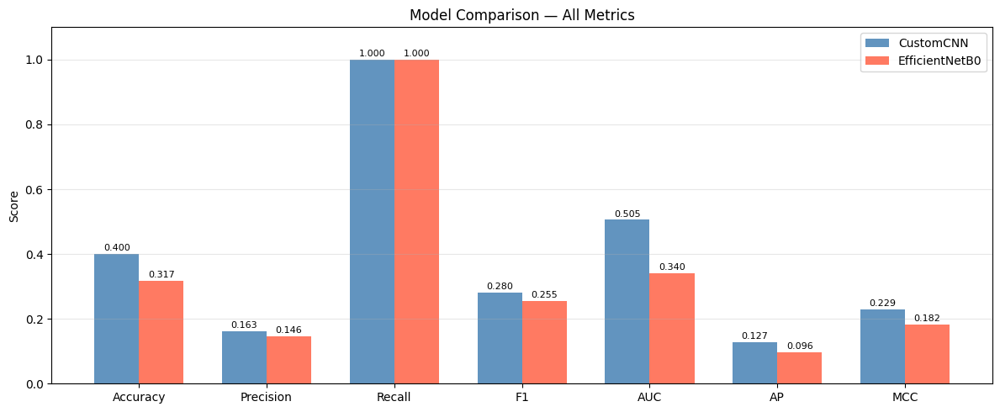

In [13]:
comparison = pd.DataFrame([cnn_metrics, eff_metrics])
comparison.to_csv('outputs/tables/model_comparison.csv', index=False)
print(comparison.to_string(index=False))

# Bar chart
metric_cols = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'AP', 'MCC']
comp_plot = comparison.set_index('Model')[metric_cols]

fig, ax = plt.subplots(figsize=(12, 5))
x = np.arange(len(metric_cols))
width = 0.35
bars1 = ax.bar(x - width/2, comp_plot.iloc[0], width, label=comp_plot.index[0],
               color='steelblue', alpha=0.85)
bars2 = ax.bar(x + width/2, comp_plot.iloc[1], width, label=comp_plot.index[1],
               color='tomato',   alpha=0.85)

for bar in list(bars1) + list(bars2):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=8)

ax.set_xticks(x); ax.set_xticklabels(metric_cols)
ax.set_ylim(0, 1.1); ax.set_ylabel('Score')
ax.set_title('Model Comparison — All Metrics')
ax.legend(); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('outputs/figures/model_comparison.pdf', bbox_inches='tight')
plt.show(); plt.close()


## 8 · Error Analysis

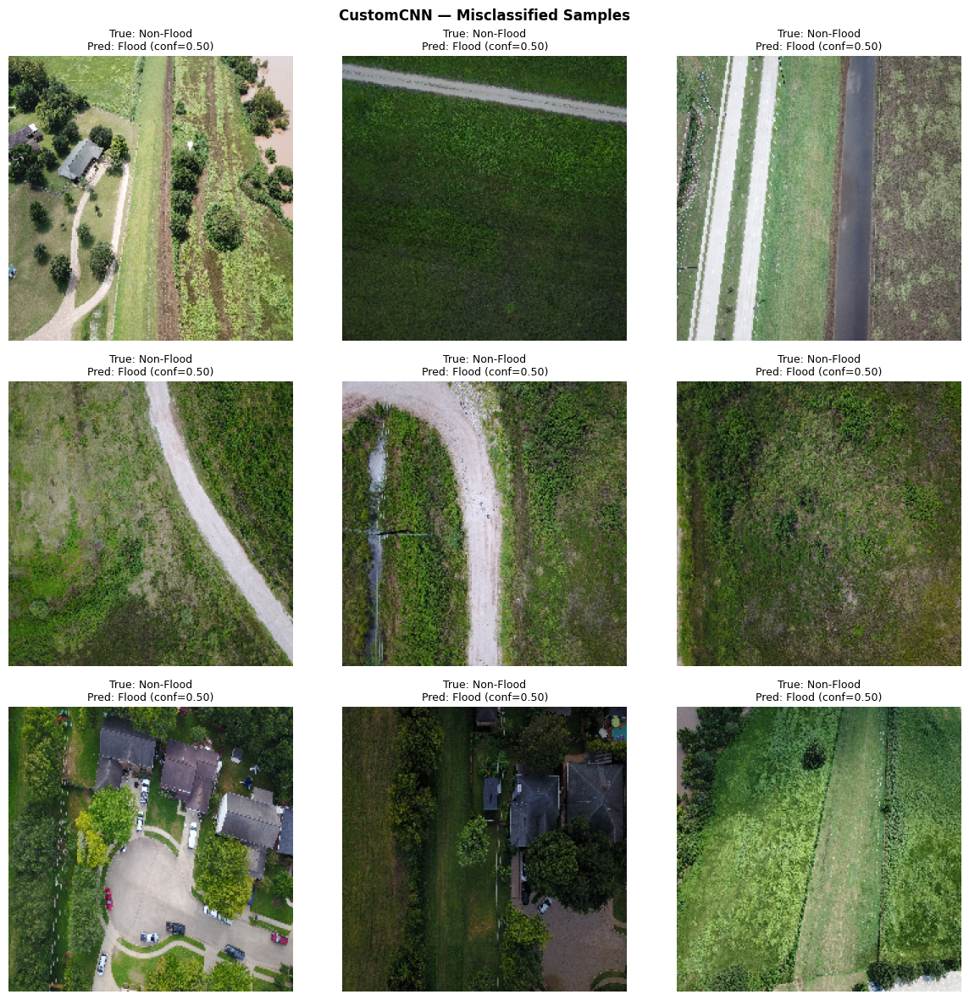

[CustomCNN] Misclassified 53 / 60 test images


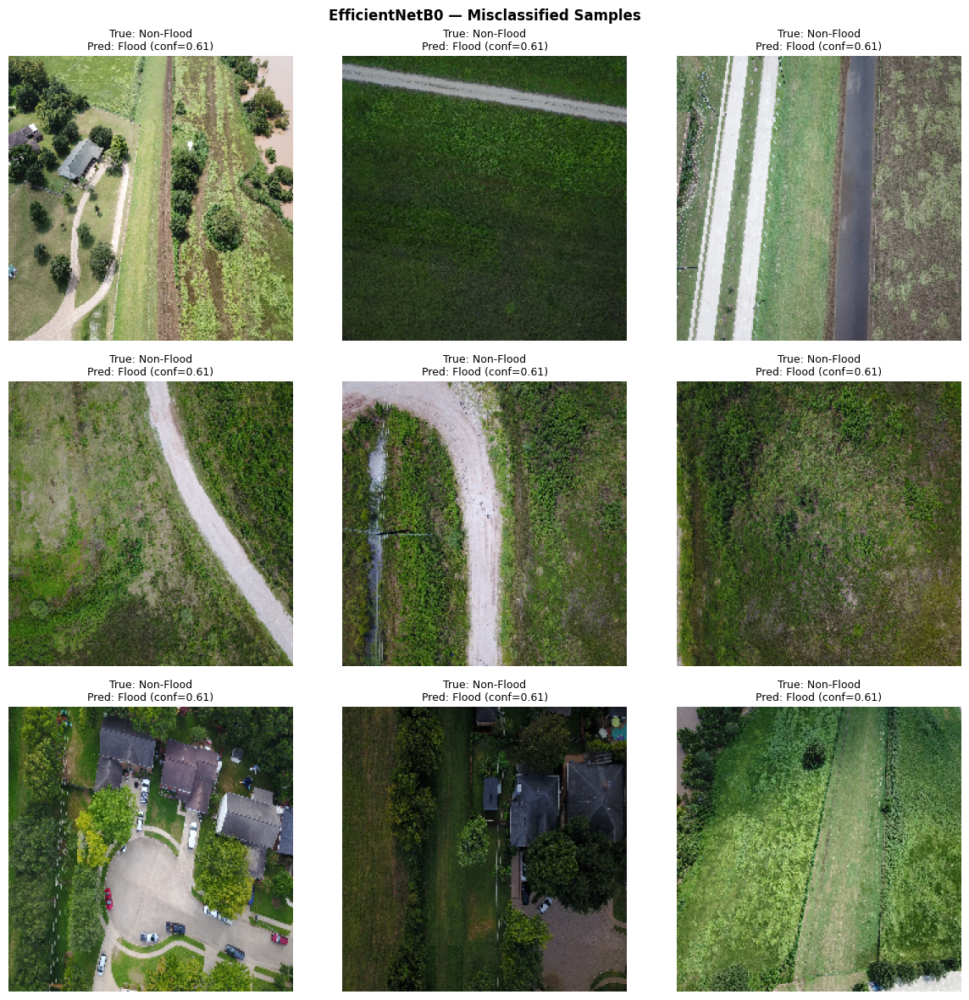

[EfficientNetB0] Misclassified 53 / 60 test images


In [14]:
def show_errors(model, name, n=9):
    probs = model.predict(X_test, verbose=0).flatten()
    preds = (probs > 0.5).astype(int)
    wrong = np.where(preds != y_test)[0]
    if len(wrong) == 0:
        print(f'[{name}] No misclassifications on test set!')
        return

    n = min(n, len(wrong))
    cols = 3
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    axes = axes.flatten()

    for i, idx in enumerate(wrong[:n]):
        conf = probs[idx]
        axes[i].imshow(X_test[idx])
        axes[i].set_title(
            f'True: {"Flood" if y_test[idx]==1 else "Non-Flood"}\n'
            f'Pred: {"Flood" if preds[idx]==1 else "Non-Flood"} '
            f'(conf={conf:.2f})',
            fontsize=9
        )
        axes[i].axis('off')
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f'{name} — Misclassified Samples', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'outputs/figures/{name}_errors.pdf', bbox_inches='tight')
    plt.show(); plt.close()
    print(f'[{name}] Misclassified {len(wrong)} / {len(X_test)} test images')

show_errors(cnn,    'CustomCNN')
show_errors(eff_ft, 'EfficientNetB0')


## 9 · Grad-CAM Visualisations

[CustomCNN] Grad-CAM target layer: last_conv


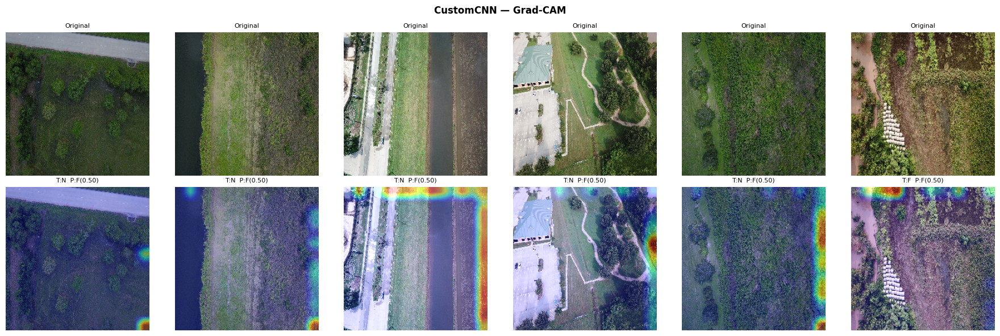

[EfficientNetB0] Grad-CAM target layer: top_conv


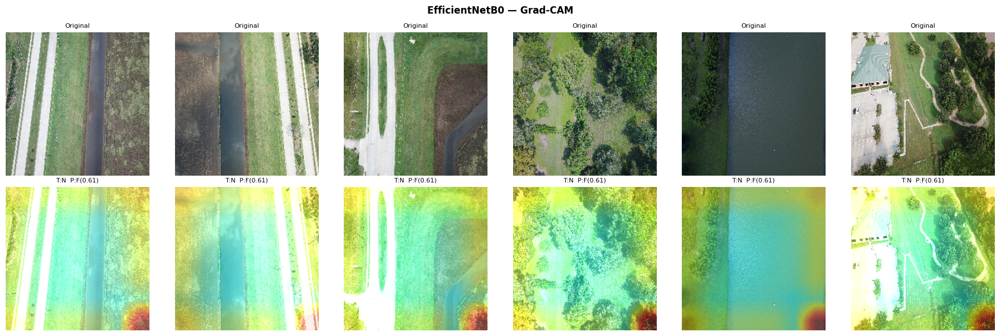

In [19]:
def make_gradcam_heatmap(img_array: np.ndarray, model, last_conv_name: str) -> np.ndarray:
    img_tensor = tf.cast(img_array, tf.float32)

    # 1. Find which model owns the target layer
    def find_owner(m, name):
        for layer in m.layers:
            if layer.name == name:
                return m, layer
            if hasattr(layer, 'layers'):
                result = find_owner(layer, name)
                if result:
                    return result
        return None

    result = find_owner(model, last_conv_name)
    if result is None:
        raise ValueError(f"Layer '{last_conv_name}' not found anywhere in model.")
    owner_model, target_layer = result

    # 2. Build a self-contained sub-model from the owner
    conv_out_model = tf.keras.Model(
        inputs=owner_model.inputs,
        outputs=[target_layer.output, owner_model.output],
        name='gradcam_sub'
    )

    # 3. If layer is inside a nested sub-model, feed it directly —
    #    skip trying to walk top-level layers (InputLayer causes TypeError)
    if owner_model is not model:
        # owner_model is the EfficientNet base; its input is the image directly
        sub_input = img_tensor
    else:
        sub_input = img_tensor

    # 4. GradientTape — no training= kwarg anywhere
    sub_var = tf.Variable(sub_input, trainable=False, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(sub_var)
        outputs      = conv_out_model(sub_var)
        conv_outputs = outputs[0]
        loss         = outputs[1][:, 0]

    grads        = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap      = tf.reduce_sum(pooled_grads * conv_outputs[0], axis=-1)
    heatmap      = tf.maximum(heatmap, 0)
    heatmap      = heatmap / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def overlay_gradcam(img: np.ndarray, heatmap: np.ndarray,
                    alpha: float = 0.45) -> np.ndarray:
    """Resize heatmap to image size and overlay with a colour map."""
    h, w = img.shape[:2]
    hm   = cv2.resize(heatmap, (w, h))
    hm   = np.uint8(255 * hm)
    hm   = cv2.applyColorMap(hm, cv2.COLORMAP_JET)
    hm   = cv2.cvtColor(hm, cv2.COLOR_BGR2RGB) / 255.0
    return np.clip(img + alpha * hm, 0, 1)


def get_last_conv_name(model):
    """
    Return the name of the last Conv2D layer, searching nested sub-models.
    Prefers 'top_conv' for EfficientNet; falls back to the last Conv2D found.
    """
    all_conv_names = []

    def _collect(m):
        for layer in m.layers:
            if isinstance(layer, tf.keras.layers.Conv2D):
                all_conv_names.append(layer.name)
            if hasattr(layer, 'layers'):
                _collect(layer)

    _collect(model)
    if not all_conv_names:
        raise ValueError("No Conv2D layer found in model.")
    # EfficientNet names its last conv 'top_conv'; prefer it if present
    if 'top_conv' in all_conv_names:
        return 'top_conv'
    return all_conv_names[-1]


def visualise_gradcam(model, model_name, n_samples=6, last_conv_name=None):
    if last_conv_name is None:
        last_conv_name = get_last_conv_name(model)
    print(f"[{model_name}] Grad-CAM target layer: {last_conv_name}")

    sample_idx = np.random.choice(len(X_test), n_samples, replace=False)
    probs = model.predict(X_test[sample_idx], verbose=0).flatten()
    preds = (probs > 0.5).astype(int)

    fig, axes = plt.subplots(2, n_samples, figsize=(3 * n_samples, 6))
    for col, idx in enumerate(sample_idx):
        img = X_test[idx]
        t   = tf.convert_to_tensor(img[None], dtype=tf.float32)
        hm  = make_gradcam_heatmap(t, model, last_conv_name)
        ovl = overlay_gradcam(img, hm)

        label_str = (f'T:{"F" if y_test[idx] else "N"}  '
                     f'P:{"F" if preds[col] else "N"}({probs[col]:.2f})')

        axes[0, col].imshow(img)
        axes[0, col].set_title('Original', fontsize=8)
        axes[0, col].axis('off')

        axes[1, col].imshow(ovl)
        axes[1, col].set_title(label_str, fontsize=8)
        axes[1, col].axis('off')

    plt.suptitle(f'{model_name} — Grad-CAM', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'outputs/figures/{model_name}_gradcam.pdf', bbox_inches='tight')
    plt.show(); plt.close()


# ── Run Grad-CAM ─────────────────────────────────────────────────────────────
# CustomCNN: last conv is directly named 'last_conv'
visualise_gradcam(cnn, 'CustomCNN', last_conv_name='last_conv')

# EfficientNetB0: auto-detect (finds 'top_conv' inside the nested base)
visualise_gradcam(eff_ft, 'EfficientNetB0')


## 10 · Prediction Confidence Distribution

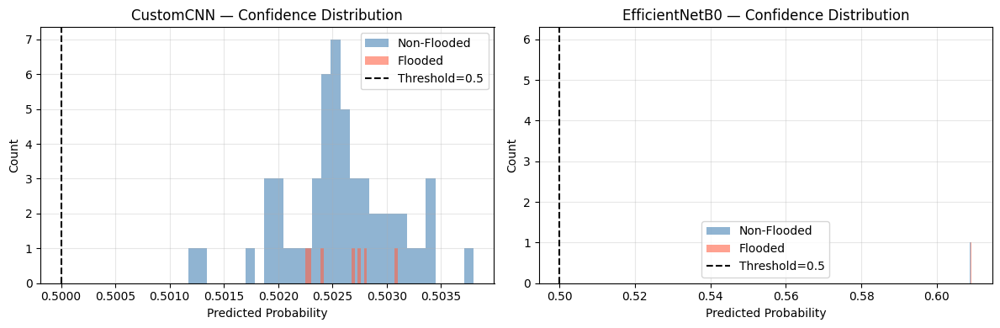

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

for ax, model, name in zip(axes, [cnn, eff_ft], ['CustomCNN', 'EfficientNetB0']):
    probs = model.predict(X_test, verbose=0).flatten()
    ax.hist(probs[y_test == 0], bins=30, alpha=0.6, label='Non-Flooded', color='steelblue')
    ax.hist(probs[y_test == 1], bins=30, alpha=0.6, label='Flooded',     color='tomato')
    ax.axvline(0.5, color='black', linestyle='--', label='Threshold=0.5')
    ax.set_title(f'{name} — Confidence Distribution')
    ax.set_xlabel('Predicted Probability'); ax.set_ylabel('Count')
    ax.legend(); ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('outputs/figures/confidence_distribution.pdf', bbox_inches='tight')
plt.show(); plt.close()


## 11 · Save Models & Final Summary

In [22]:
# Save in SavedModel format (recommended over .h5 for production)
cnn.save('outputs/models/cnn_final.keras')
eff_ft.save('outputs/models/efficientnet_final.keras')
print('Models saved.')

# Final summary table
summary_df = pd.DataFrame([cnn_metrics, eff_metrics])
print('\n── Final Results ──')
print(summary_df.to_string(index=False))

# Identify winner per metric
print('\n── Best Model per Metric ──')
for col in ['Accuracy','Precision','Recall','F1','AUC','AP','MCC']:
    best = summary_df.loc[summary_df[col].idxmax(), 'Model']
    val  = summary_df[col].max()
    print(f'  {col:12s}: {best}  ({val:.4f})')

print('\nAll outputs saved under outputs/figures/, outputs/tables/, outputs/models/')


Models saved.

── Final Results ──
         Model  Accuracy  Precision  Recall       F1      AUC       AP      MCC  OptThreshold
     CustomCNN  0.400000   0.162791     1.0 0.280000 0.505391 0.127284 0.228508      0.502457
EfficientNetB0  0.316667   0.145833     1.0 0.254545 0.339623 0.096209 0.181711      0.610769

── Best Model per Metric ──
  Accuracy    : CustomCNN  (0.4000)
  Precision   : CustomCNN  (0.1628)
  Recall      : CustomCNN  (1.0000)
  F1          : CustomCNN  (0.2800)
  AUC         : CustomCNN  (0.5054)
  AP          : CustomCNN  (0.1273)
  MCC         : CustomCNN  (0.2285)

All outputs saved under outputs/figures/, outputs/tables/, outputs/models/
